Bulk objects inspection; apply GAIA->LS filter transformation; compute averaged profiles

In [1]:
from __future__ import division, print_function
import matplotlib.pyplot as plt
import numpy as np
from astropy.table import Table, vstack, hstack
import fitsio
import sys, os, glob, time, warnings, gc

In [2]:
params = {'legend.fontsize': 'large',
         'axes.labelsize': 'large',
         'axes.titlesize':'large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'large',
         'figure.facecolor':'w'} 
plt.rcParams.update(params)

In [3]:
# DECaLS NGC
field = 'south'
output_name = 'decals_ngc'
band = 'r'

ls_mag_bins = [10.5, 11.75, 13.0, 14.25, 15.5]

In [4]:
profile = Table.read('../data/average_profiles_{}_{}_{}.txt'.format(field, output_name, band), format='ascii.commented_header')
indiv = Table.read('../data/individual_profiles_{}_{}_{}.fits'.format(field, output_name, band))

profile[:3]

radius_r_10.50,flux_r_10.50,flux_scatter_r_10.50,radius_r_11.75,flux_r_11.75,flux_scatter_r_11.75,radius_r_13.00,flux_r_13.00,flux_scatter_r_13.00,radius_r_14.25,flux_r_14.25,flux_scatter_r_14.25,radius_r_15.50,flux_r_15.50,flux_scatter_r_15.50
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
0.7638546982247344,145.91387168488333,4.609875157640116,0.7638546982247344,146.19764180333394,5.496273089140141,0.7159131272526946,145.59920741045264,4.727310292886146,0.6679715562806549,153.22921137392404,28.62144262882833,0.7638546982247344,99.26436371554419,7.36558702753698
1.582879022540889,145.91396338513707,4.609589762660117,1.4936298068798708,146.32393439785943,5.400249498202645,1.708031030163094,140.78738027658392,15.561188103417939,1.582879022540889,22.271436975710433,8.513906384871806,1.582879022540889,7.962756503523365,2.5196589245424716
2.5198353120789463,144.1311415357119,5.9159902766540275,2.5198353120789463,38.17481888307985,11.467262038162703,2.5737416342748936,10.74384696710667,3.9945374878025985,2.5198353120789463,3.4267928477237595,1.274227900828378,2.5198353120789463,1.1831328154410814,0.4231935556095031


In [5]:
# plt.plot(profile['radius_g_10.50'], profile['flux_scatter_g_10.50']/profile['flux_g_10.50'])
# plt.grid(alpha=0.5)
# plt.show()

# plt.plot(profile['radius_g_13.00'], profile['flux_scatter_g_13.00']/profile['flux_g_13.00'])
# plt.grid(alpha=0.5)
# plt.show()

# plt.plot(profile['radius_g_15.50'], profile['flux_scatter_g_15.50']/profile['flux_g_15.50'])
# plt.grid(alpha=0.5)
# plt.show()

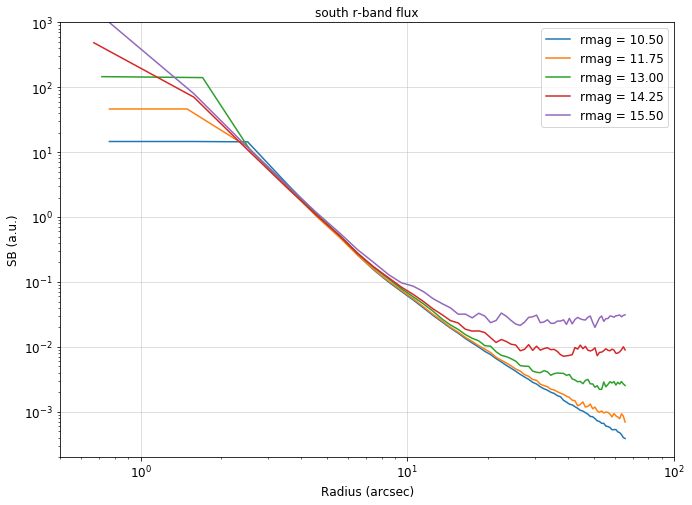

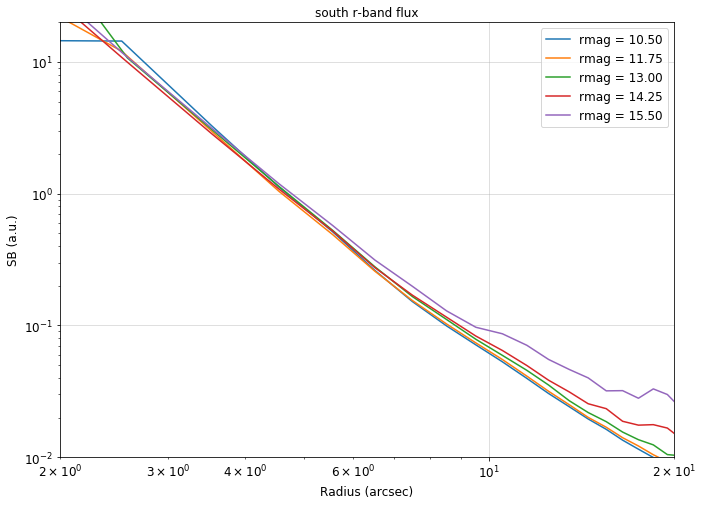

In [6]:
plt.figure(figsize=(11, 8))
for index in range(len(ls_mag_bins)):
    # normalize the flux to 13th magnitude stars
    norm = 10**((ls_mag_bins[index]-13)/2.5)
    x = profile['radius_{}_{:.2f}'.format(band, ls_mag_bins[index])]
    y = norm * profile['flux_{}_{:.2f}'.format(band, ls_mag_bins[index])]
    plt.loglog(x, y, lw=1.5, alpha=1., 
               label='{}mag = {:.2f}'.format(band, ls_mag_bins[index]), c='C'+str(index))
plt.title('{} {}-band flux'.format(field, band))
plt.axis([.5, 100, .0002, 1000])
# plt.axis([2, 20, 0.01, 20])
plt.grid(alpha=0.5)
plt.xlabel('Radius (arcsec)')
plt.ylabel('SB (a.u.)')
plt.legend()
plt.show()

plt.figure(figsize=(11, 8))
for index in range(len(ls_mag_bins)):
    # normalize the flux to 13th magnitude stars
    norm = 10**((ls_mag_bins[index]-13)/2.5)
    x = profile['radius_{}_{:.2f}'.format(band, ls_mag_bins[index])]
    y = norm * profile['flux_{}_{:.2f}'.format(band, ls_mag_bins[index])]
    plt.loglog(x, y, lw=1.5, alpha=1., 
               label='{}mag = {:.2f}'.format(band, ls_mag_bins[index]), c='C'+str(index))
plt.title('{} {}-band flux'.format(field, band))
# plt.axis([.5, 100, .0002, 1000])
plt.axis([2, 20, 0.01, 20])
plt.grid(alpha=0.5)
plt.xlabel('Radius (arcsec)')
plt.ylabel('SB (a.u.)')
plt.legend()
plt.show()

10.5


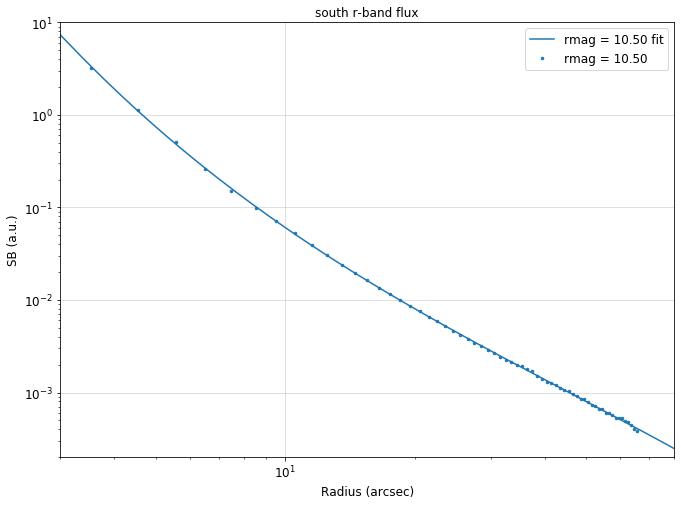

In [7]:
fit_index = 0
print(ls_mag_bins[fit_index])
# normalize the flux to 13th magnitude stars
norm = 10**((ls_mag_bins[fit_index]-13)/2.5)
x = profile['radius_{}_{:.2f}'.format(band, ls_mag_bins[fit_index])]
y = norm * profile['flux_{}_{:.2f}'.format(band, ls_mag_bins[fit_index])]

mask = x>3
xlog, ylog = np.log10(x), np.log10(y)
poly = np.polyfit(xlog[mask], ylog[mask], deg=3)
fit = np.poly1d(poly)

xfit = np.linspace(3, 80, 200)
yfit = 10**(fit(np.log10(xfit)))

plt.figure(figsize=(11, 8))
plt.loglog(xfit, yfit, '-', lw=1.5, alpha=1., 
           label='{}mag = {:.2f} fit'.format(band, ls_mag_bins[fit_index]), c='C'+str(fit_index))

index = fit_index
# normalize the flux to 13th magnitude stars
norm = 10**((ls_mag_bins[index]-13)/2.5)
x = profile['radius_{}_{:.2f}'.format(band, ls_mag_bins[index])]
y = norm * profile['flux_{}_{:.2f}'.format(band, ls_mag_bins[index])]
plt.loglog(x, y, '.', lw=1.5, alpha=1., ms=5.,
           label='{}mag = {:.2f}'.format(band, ls_mag_bins[index]), c='C'+str(index))
plt.title('{} {}-band flux'.format(field, band))
plt.axis([3, 80, .0002, 10])
plt.grid(alpha=0.5)
plt.xlabel('Radius (arcsec)')
plt.ylabel('SB (a.u.)')
plt.legend()
plt.show()

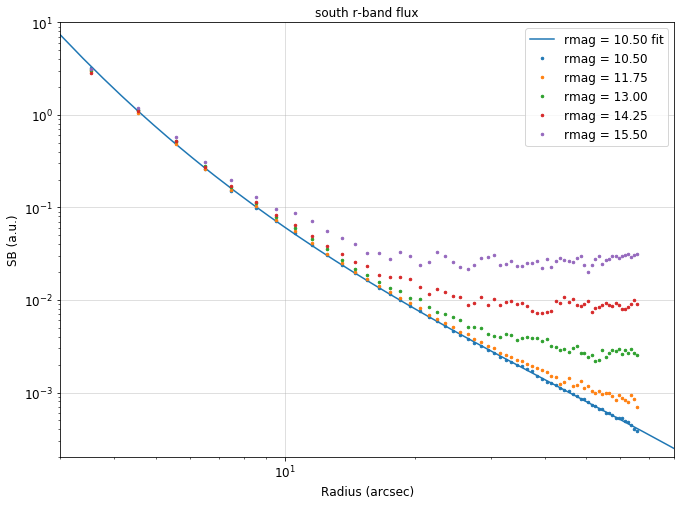

In [8]:
plt.figure(figsize=(11, 8))
plt.loglog(xfit, yfit, '-', lw=1.5, alpha=1., 
           label='{}mag = {:.2f} fit'.format(band, ls_mag_bins[fit_index]), c='C'+str(fit_index))
for index in range(len(ls_mag_bins)):
    # normalize the flux to 13th magnitude stars
    norm = 10**((ls_mag_bins[index]-13)/2.5)
    x = profile['radius_{}_{:.2f}'.format(band, ls_mag_bins[index])]
    y = norm * profile['flux_{}_{:.2f}'.format(band, ls_mag_bins[index])]
    plt.loglog(x, y, '.', lw=1.5, alpha=1., ms=5.,
               label='{}mag = {:.2f}'.format(band, ls_mag_bins[index]), c='C'+str(index))
plt.title('{} {}-band flux'.format(field, band))
plt.axis([3, 80, .0002, 10])
plt.grid(alpha=0.5)
plt.xlabel('Radius (arcsec)')
plt.ylabel('SB (a.u.)')
plt.legend()
plt.show()

------
# Apply the fit to actual images

In [9]:
def binned_stats(x, y, bins):
    from scipy import stats
    nmad = lambda x: 1.4826*np.median(np.abs(x-np.median(x)))
    bin_center, bin_median, bin_scatter = np.zeros((3, len(bins)-1))
    for index in range(len(bins)-1):
        mask = (x>bins[index]) & (x<bins[index+1])
        bin_center[index] = np.median(x[mask])
        if np.sum(mask)>0:
            bin_median[index] = np.median(y[mask])
            bin_scatter[index] = nmad(y[mask])
        else:
            bin_median[index], bin_scatter[index] = np.nan, np.nan
    return bin_center, bin_median, bin_scatter

def plot_cutout(img, pixscale, vmin=-1, vmax=1, unit='arcsec'):
    if unit=='arcsec':
        extent = 0.5*pixscale*img.shape[0]*np.array([-1, 1, -1, 1])
    elif unit=='arcmin':
        extent = 0.5*pixscale*img.shape[0]*np.array([-1, 1, -1, 1])/60.
    elif unit=='deg':
        extent = 0.5*pixscale*img.shape[0]*np.array([-1, 1, -1, 1])/3600.
    else:
        raise ValueError('unrecognized unit')
    fig, ax = plt.subplots(figsize=(8, 8))
    dens = ax.imshow(img, aspect='equal', 
               cmap='seismic', extent=extent, vmin=vmin, vmax=vmax)
    ax.axvline(0, ls='--', lw=0.5, color='grey')
    ax.axhline(0, ls='--', lw=0.5, color='grey')
    fig.colorbar(dens, fraction=0.046, pad=0.04)
    return ax

def plot_cutout_sizebysize(img1, img2, title1, title2, pixscale, vmin=-1, vmax=1, unit='arcsec'):
    if unit=='arcsec':
        extent = 0.5*pixscale*img.shape[0]*np.array([-1, 1, -1, 1])
    elif unit=='arcmin':
        extent = 0.5*pixscale*img.shape[0]*np.array([-1, 1, -1, 1])/60.
    elif unit=='deg':
        extent = 0.5*pixscale*img.shape[0]*np.array([-1, 1, -1, 1])/3600.
    else:
        raise ValueError('unrecognized unit')
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(img1, aspect='equal', 
               cmap='seismic', extent=extent, vmin=vmin, vmax=vmax)
    axes[0].axvline(0, ls='--', lw=0.5, color='grey')
    axes[0].axhline(0, ls='--', lw=0.5, color='grey')
    axes[0].set_title(title1)
    im = axes[1].imshow(img2, aspect='equal', 
               cmap='seismic', extent=extent, vmin=vmin, vmax=vmax)
    axes[1].axvline(0, ls='--', lw=0.5, color='grey')
    axes[1].axhline(0, ls='--', lw=0.5, color='grey')
    axes[1].set_title(title2)
    # fig.colorbar(im, fraction=0.046, pad=0.04)
    return axes

In [10]:
# gaia1 and gaia2: DECaLS/DES SGC; gaia3: BASS/MzLS; gaia4: DECaLS NGC
gaia_fn = 'gaia4.fits.gz'
field = 'south'
# gaia_fn = 'gaia3.fits.gz'
# field = 'north'
gaia = Table.read('/Users/rongpu/Documents/data/desi_misc/gaia_from_arjun/'+gaia_fn)
print(len(gaia))

if (gaia_fn=='gaia1.fits.gz') or (gaia_fn=='gaia2.fits.gz'):
    mask = gaia['dec']<31.
    gaia = gaia[mask]
    print(len(gaia))
                                  
if (gaia_fn=='gaia3.fits.gz'):
    mask = gaia['dec']>32.375
    gaia = gaia[mask]
    print(len(gaia))
    
# Remove the globular cluster in DECaLS
mask = (gaia['ra']>198.0) & (gaia['ra']<198.5) & (gaia['dec']>18.0) & (gaia['dec']<18.4) 
gaia = gaia[~mask]
print(len(gaia))

# Remove duplicates
if len(np.unique(gaia['source_id']))<len(gaia):
    print('Duplicates exist!')
    gaia.sort('source_id')
    mask = gaia['source_id'][1:]==gaia['source_id'][:-1]
    mask = np.concatenate([[False], mask])
    gaia = gaia[~mask]
    
# Remove objects with invalide mask = np.isfinite(gaia['bp_rp'])
mask = np.isfinite(gaia['bp_rp'])
if np.sum(~mask)>0:
    print('{} objects with invalid bp_rp'.format(np.sum(~mask)))
    gaia = gaia[mask]
    
# Apply GAIA-LS transformation
from scipy.interpolate import interp1d
transform_interp = {}
for band in ['g', 'r', 'z']:
    if field=='north':
        tmp = np.load('../data/gaia_bassmzls_{}_transform.npz'.format(band))
    else:
        tmp = np.load('../data/gaia_decals_{}_transform.npz'.format(band))
    bin_center, bin_median, bin_scatter = tmp['arr_0'], tmp['arr_1'], tmp['arr_2']
    transform_interp[band] = interp1d(bin_center, bin_median, bounds_error=False, fill_value='extrapolate', kind='linear')
    gaia['ls_'+band] = gaia['phot_g_mean_mag'] + transform_interp[band](gaia['bp_rp'])

603673
602678
12931 objects with invalid bp_rp


In [14]:
band = 'r'
ls_mag_bins1 = np.linspace(8.5, 15.5, 21)

ls_r = 8.499
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3939279274440011264_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=200.769370&dec=19.266331&layer=dr8-south&pixscale=0.262&bands=r&size=512"


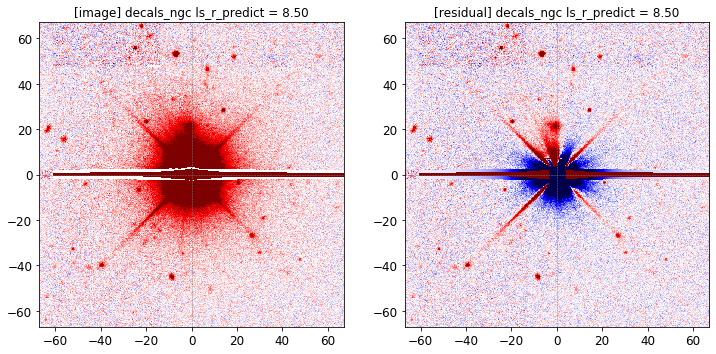

ls_r = 8.852
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3717493863423602688_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=199.206615&dec=5.925465&layer=dr8-south&pixscale=0.262&bands=r&size=512"


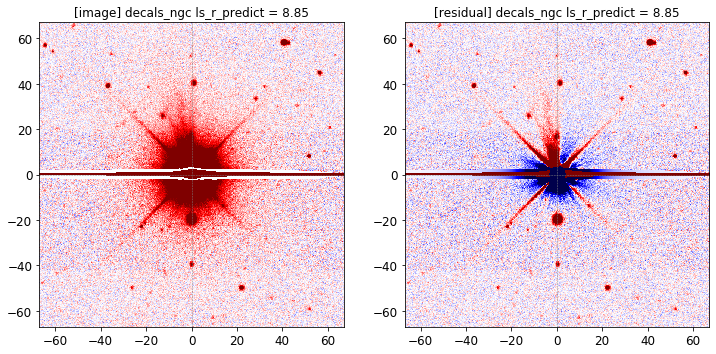

ls_r = 9.202
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3594828497939215488_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=180.570602&dec=-7.006541&layer=dr8-south&pixscale=0.262&bands=r&size=512"


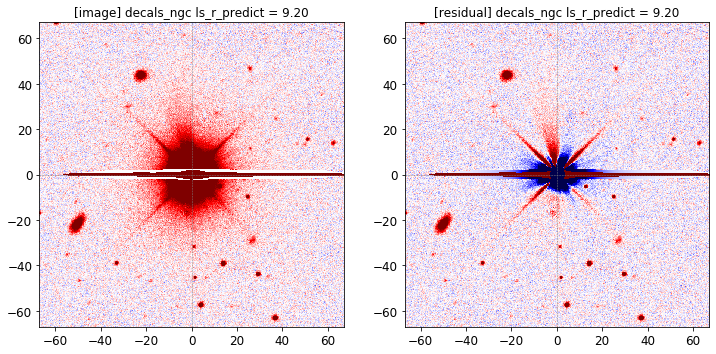

ls_r = 9.546
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3943566579514362880_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=197.903816&dec=21.564457&layer=dr8-south&pixscale=0.262&bands=r&size=512"


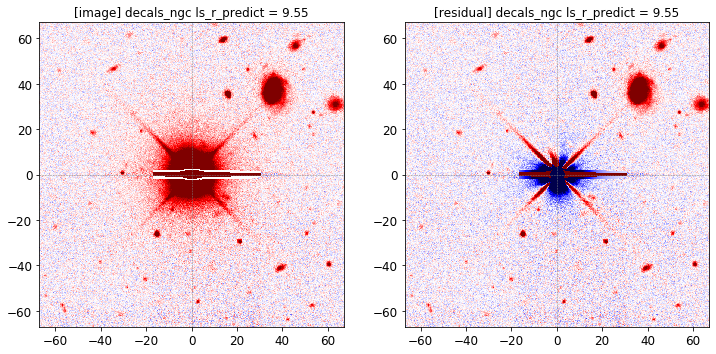

ls_r = 9.903
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3893278387994051712_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=180.080210&dec=4.119558&layer=dr8-south&pixscale=0.262&bands=r&size=512"


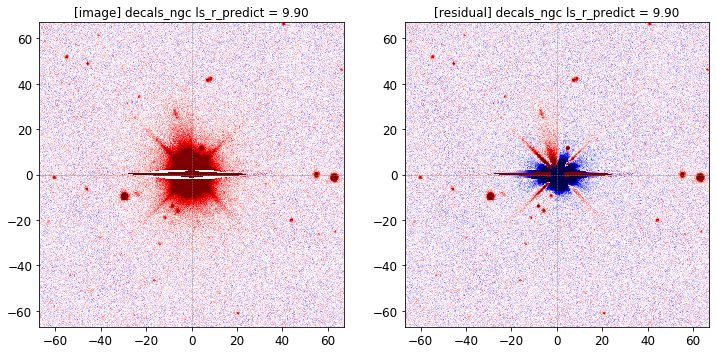

ls_r = 10.249
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3677651788280844032_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=194.340180&dec=-5.531783&layer=dr8-south&pixscale=0.262&bands=r&size=512"


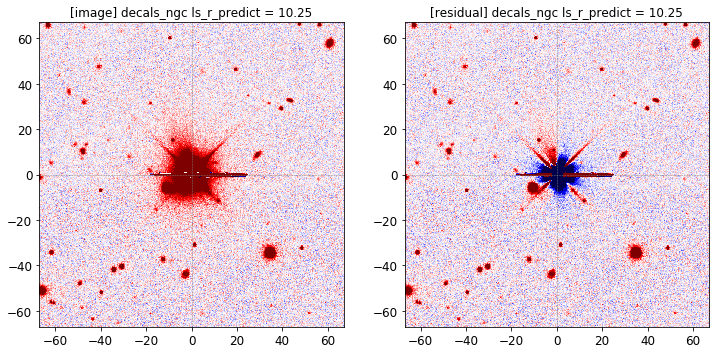

ls_r = 10.596
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3688525064926187520_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=193.709737&dec=-1.935162&layer=dr8-south&pixscale=0.262&bands=r&size=512"


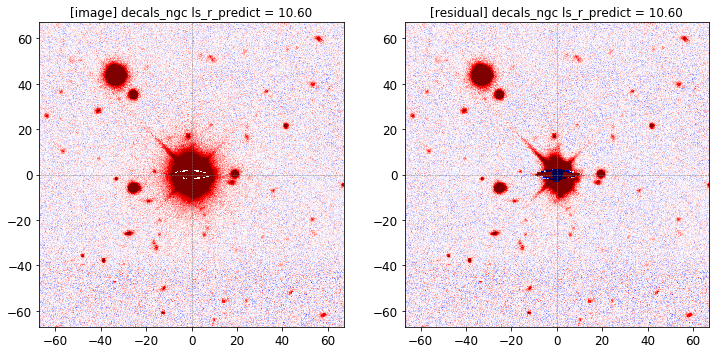

ls_r = 10.954
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3738996458276663680_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=203.599348&dec=12.366632&layer=dr8-south&pixscale=0.262&bands=r&size=512"


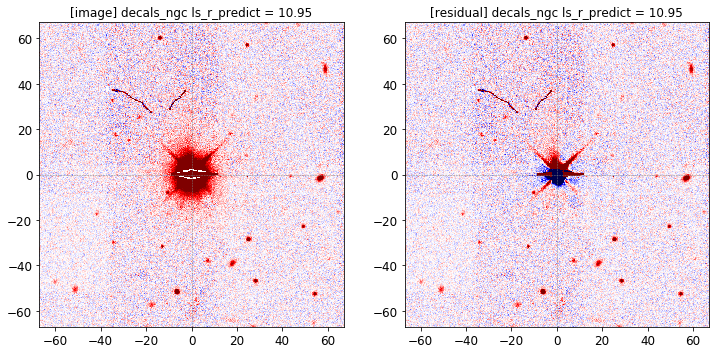

ls_r = 11.300
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3904534535203447040_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=188.571292&dec=11.367886&layer=dr8-south&pixscale=0.262&bands=r&size=512"


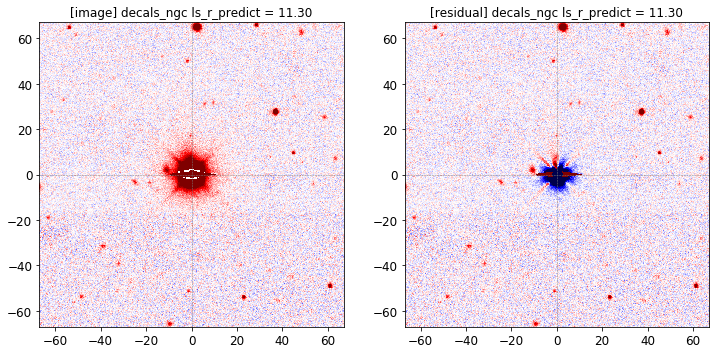

ls_r = 11.645
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3946632498969021312_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=183.095373&dec=16.732035&layer=dr8-south&pixscale=0.262&bands=r&size=512"


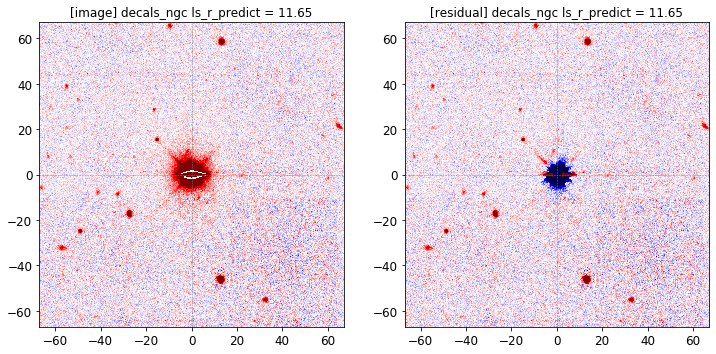

ls_r = 12.001


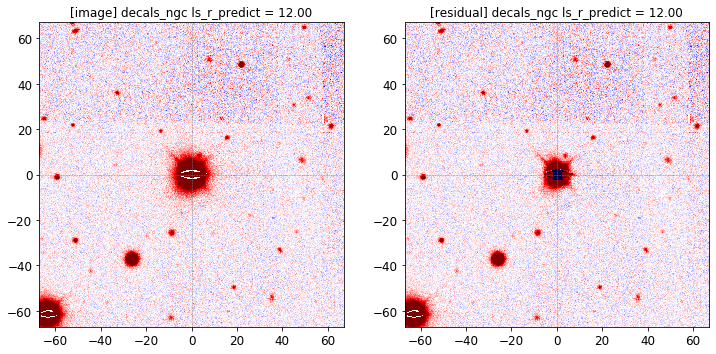

ls_r = 12.349
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3598173315389902976_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=181.744672&dec=-3.643550&layer=dr8-south&pixscale=0.262&bands=r&size=512"


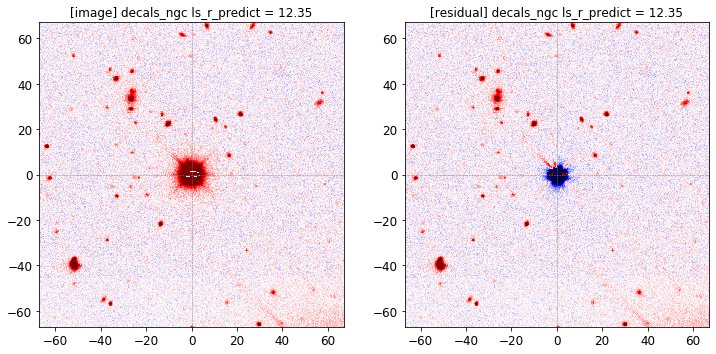

ls_r = 12.698
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3598769388130871168_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=176.406050&dec=-5.798248&layer=dr8-south&pixscale=0.262&bands=r&size=512"


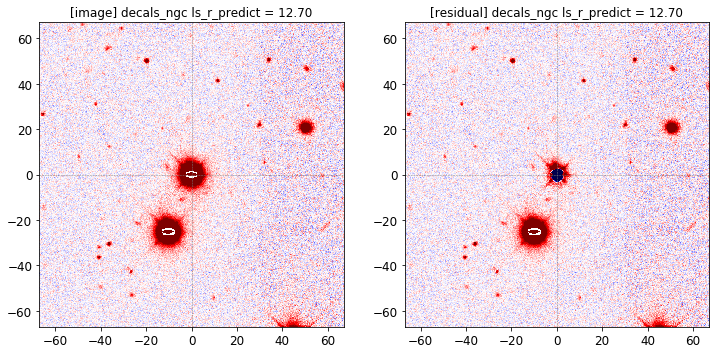

ls_r = 13.049
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3741761287639633664_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=203.361396&dec=14.652253&layer=dr8-south&pixscale=0.262&bands=r&size=512"


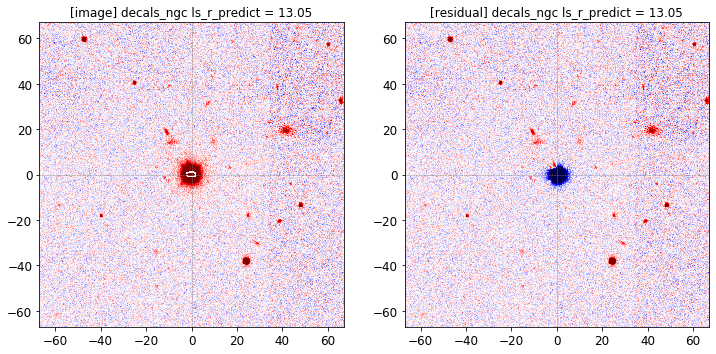

ls_r = 13.397
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3738010063202821888_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=202.215271&dec=9.862940&layer=dr8-south&pixscale=0.262&bands=r&size=512"


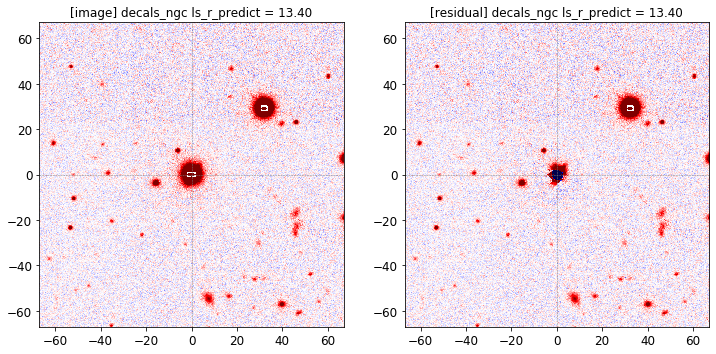

ls_r = 13.753


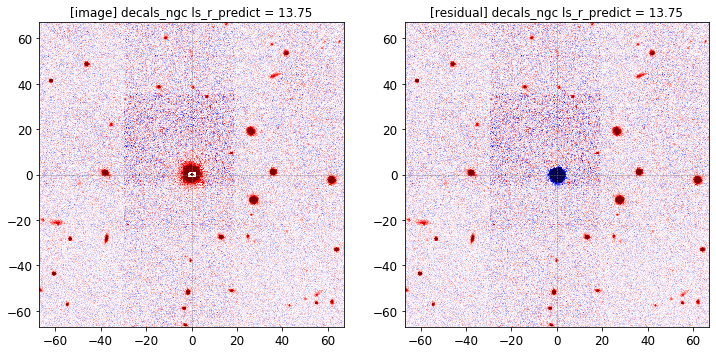

ls_r = 14.098
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3800345672348944384_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=173.208865&dec=2.645841&layer=dr8-south&pixscale=0.262&bands=r&size=512"


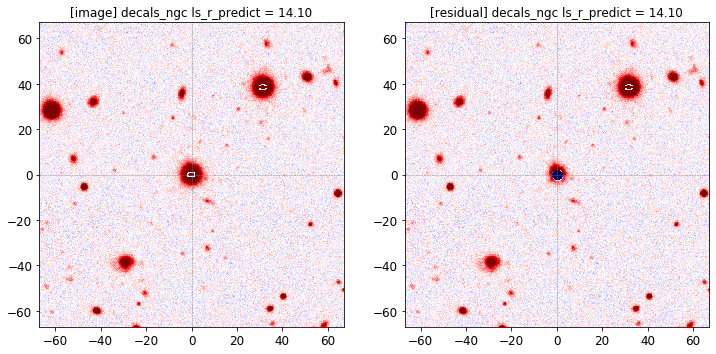

ls_r = 14.449
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3797613106780219520_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=172.310964&dec=0.575866&layer=dr8-south&pixscale=0.262&bands=r&size=512"


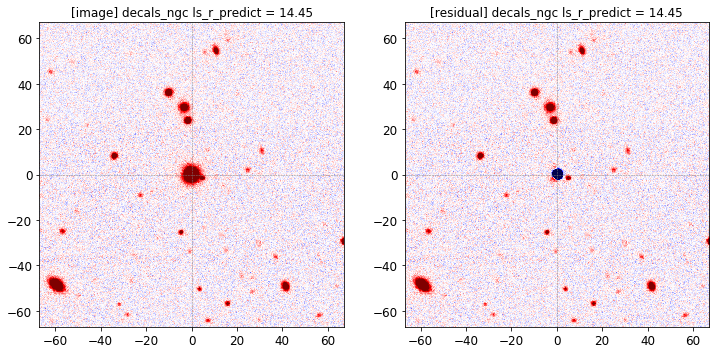

ls_r = 14.804
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/3731178247704226560_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=196.717485&dec=9.079426&layer=dr8-south&pixscale=0.262&bands=r&size=512"


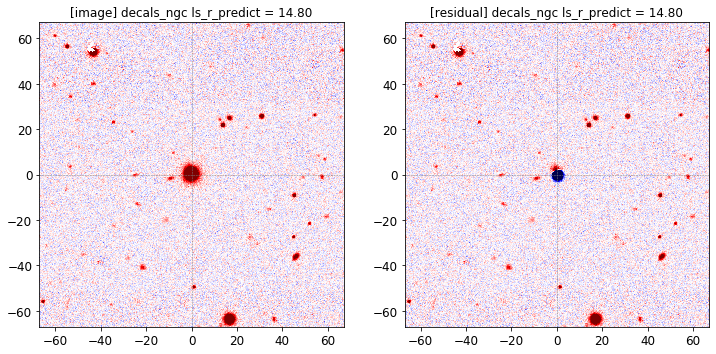

ls_r = 15.153
wget -O /Users/rongpu/Downloads/gaia_star_cutouts/cutouts/south/4001587945551096320_r_0.262_512.fits "http://legacysurvey.org/viewer/cutout.fits?ra=182.774460&dec=23.217063&layer=dr8-south&pixscale=0.262&bands=r&size=512"


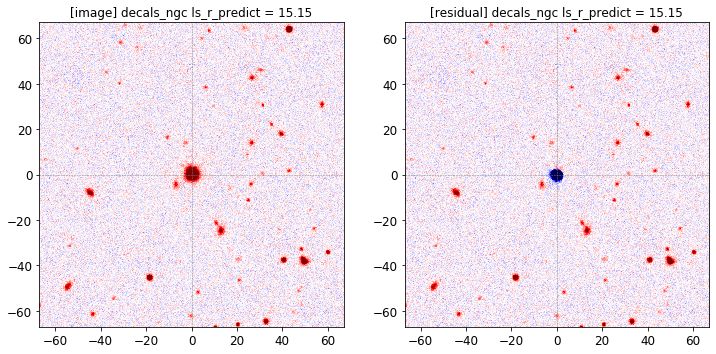

ls_r = 15.495


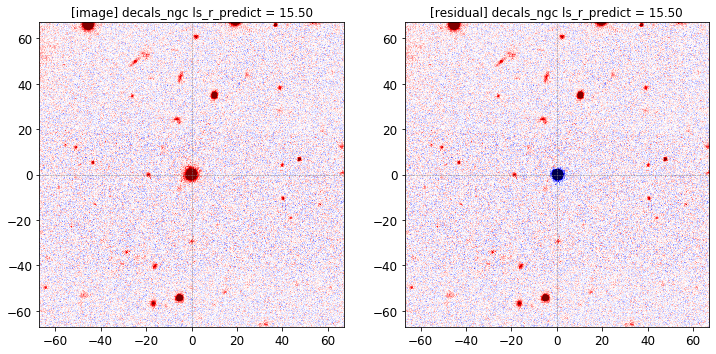

In [15]:
# img_type = '-resid'
img_type = ''
size_str = '512'
verbose = True

download_dir = '/Users/rongpu/Downloads/gaia_star_cutouts/cutouts/'

if (field=='north') and ((band=='g') or (band=='r')):
    pixscale_str = '0.454'
    radius_binsize = 1.73
else:
    pixscale_str = '0.262'
    radius_binsize = 1.
pixscale = float(pixscale_str)

ls_mag_bin_width = 0.01
for mag_index in range(len(ls_mag_bins1)):
    ls_mag_min, ls_mag_max = ls_mag_bins1[mag_index]-ls_mag_bin_width/2, ls_mag_bins1[mag_index]+ls_mag_bin_width/2
    idx = np.where((gaia['ls_'+band]>ls_mag_min) & (gaia['ls_'+band]<ls_mag_max))[0]
    np.random.seed(2)
    index = np.random.choice(idx)
    print('ls_{} = {:.3f}'.format(band, gaia['ls_'+band][index]))
    
    ra, dec = gaia['ra'][index], gaia['dec'][index]

    file_path = os.path.join(download_dir, field, '{}_{}{}_{}_{}.fits'.format(gaia['source_id'][index], band, img_type, pixscale_str, size_str))
    if not os.path.exists(os.path.dirname(file_path)):
        os.makedirs(os.path.dirname(file_path))

    if not os.path.isfile(file_path):
        url = 'http://legacysurvey.org/viewer/cutout.fits?ra={:f}&dec={:f}&layer=dr8-{}{}&pixscale={}&bands={}&size={}'.format(ra, dec, field, img_type, pixscale_str, band, size_str)
        cmd = 'wget -O '+file_path+' \"'+url+'\"'
        if verbose:
            print(cmd)
        os.system(cmd)

    img_raw = fitsio.read(file_path)
    img = img_raw / (pixscale**2)
    
    grid = pixscale * np.linspace(-0.5*(img.shape[0]-1), 0.5*(img.shape[0]-1), img.shape[0])
    xx, yy = np.meshgrid(grid, grid)
    radius = np.sqrt(xx**2 + yy**2).flatten()
    max_radius = xx.flatten().max() # maximum radius before hitting the edge of the image
    nbins = int(np.floor(max_radius/radius_binsize)+1)

    radius_grid = np.sqrt(xx**2 + yy**2)
    norm = 10**((gaia['ls_'+band][index]-13)/2.5)
    img_fit = 10**(fit(np.log10(radius_grid)))/norm

    # Remove masked pixels
    mask = img.flatten()!=0
    radius = radius[mask]
    flux = img.flatten()[mask]

    bin_center, bin_median, bin_scatter = binned_stats(radius, flux, bins=np.linspace(0., np.floor(max_radius), nbins))
    # normalize to the magnitude bin center
    bin_median = bin_median * 10**((gaia['ls_'+band][index]-ls_mag_bins1[mag_index])/2.5)

    vrange = 1.
    
    # ax = plot_cutout(img, pixscale, vmin=-vrange, vmax=vrange)
    # ax.set_title('[image] {} ls_{}_predict = {:.2f}'.format(output_name, band, gaia['ls_'+band][index]))
    # # ax.axis([-40, 40, -40, 40])
    # # plt.savefig(os.path.join(plot_dir, os.path.basename(file_path)[:-5]+'_image.png'))
    # plt.show()

    # ax = plot_cutout(img-img_fit, pixscale, vmin=-vrange, vmax=vrange)
    # ax.set_title('[residual] {} ls_{}_predict = {:.2f}'.format(output_name, band, gaia['ls_'+band][index]))
    # # ax.axis([-40, 40, -40, 40])
    # # plt.savefig(os.path.join(plot_dir, os.path.basename(file_path)[:-5]+'_image.png'))
    # plt.show()

    ax = plot_cutout_sizebysize(img, img-img_fit,
                           title1 = '[image] {} ls_{}_predict = {:.2f}'.format(output_name, band, gaia['ls_'+band][index]),
                           title2 = '[residual] {} ls_{}_predict = {:.2f}'.format(output_name, band, gaia['ls_'+band][index]),
                           pixscale=pixscale, vmin=-vrange, vmax=vrange)
    plt.show()
    
    # plt.figure(figsize=(8, 6))
    # plt.plot(radius, flux, '.', ms=0.5)
    # plt.plot(bin_center, bin_median, c='C1')
    # plt.errorbar(bin_center, bin_median, yerr=bin_scatter, lw=1, alpha=0.6, c='C1')
    # plt.axis([0, 70, -1, 5])
    # plt.axhline(0, lw=1, color='r')
    # plt.grid(alpha=0.5)
    # plt.title('['+band+'-band]  GAIA_G={:.4f}'.format(gaia['phot_g_mean_mag'][index]))
    # # plt.savefig(os.path.join(plot_dir, os.path.basename(file_path)[:-5]+'_profile.png'))
    # plt.show()

    # plt.figure(figsize=(8, 6))
    # plt.loglog(radius, flux, '.', ms=0.5)
    # plt.plot(bin_center, bin_median, c='C1')
    # plt.errorbar(bin_center, bin_median, yerr=bin_scatter, lw=1, alpha=0.6, c='C1')
    # plt.axis([.5, 70, .02, 200])
    # plt.grid(alpha=0.5)
    # plt.title('['+band+'-band]  GAIA_G={:.4f}'.format(gaia['phot_g_mean_mag'][index]))
    # # plt.savefig(os.path.join(plot_dir, os.path.basename(file_path)[:-5]+'_profile_log.png'))
    # plt.show()